## Attribute: Gage Height
####  Dataset Charleston_Gh

####  Outliers removed

## Models: GRU, BiLSTM, LSTM
#### Early Stopping Callbacks removed (50 epoch is used for all for model comparison)
#### Prediction = Red, Real data = Blue 

## MAPE, r2 score and train/test plot added

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt 
import os
import plotly.graph_objects as go
import plotly.express as px

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, layers, callbacks
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional

In [6]:
# dataset file path
csv_path = '../Datasets/Charleston_Gh.csv'


# reading the dataset
water_data = pd.read_csv(csv_path)
water_data

,Date,Gage height
0,1/14/08 1:00,2.584704
1,1/14/08 2:00,2.548128
2,1/14/08 3:00,2.520696
3,1/14/08 4:00,2.511552
4,1/14/08 5:00,2.505456
...,...,...
104679,1/10/22 20:00,2.468880
104680,1/10/22 21:00,2.517648
104681,1/10/22 22:00,2.639568
104682,1/10/22 23:00,2.651760


In [7]:
# creating additional columns in the dataframe for further process
water_data['timestamp'] = pd.to_datetime(water_data['Date'])
water_data['gage_height'] = water_data['Gage height']


In [8]:
water_data

,Date,Gage height,timestamp,gage_height
0,1/14/08 1:00,2.584704,2008-01-14 01:00:00,2.584704
1,1/14/08 2:00,2.548128,2008-01-14 02:00:00,2.548128
2,1/14/08 3:00,2.520696,2008-01-14 03:00:00,2.520696
3,1/14/08 4:00,2.511552,2008-01-14 04:00:00,2.511552
4,1/14/08 5:00,2.505456,2008-01-14 05:00:00,2.505456
...,...,...,...,...
104679,1/10/22 20:00,2.468880,2022-01-10 20:00:00,2.468880
104680,1/10/22 21:00,2.517648,2022-01-10 21:00:00,2.517648
104681,1/10/22 22:00,2.639568,2022-01-10 22:00:00,2.639568
104682,1/10/22 23:00,2.651760,2022-01-10 23:00:00,2.651760


In [9]:
# drop unnecessary colums
water_data =water_data.drop(['Date','Gage height'], axis=1)
water_data

,timestamp,gage_height
0,2008-01-14 01:00:00,2.584704
1,2008-01-14 02:00:00,2.548128
2,2008-01-14 03:00:00,2.520696
3,2008-01-14 04:00:00,2.511552
4,2008-01-14 05:00:00,2.505456
...,...,...
104679,2022-01-10 20:00:00,2.468880
104680,2022-01-10 21:00:00,2.517648
104681,2022-01-10 22:00:00,2.639568
104682,2022-01-10 23:00:00,2.651760


In [10]:
fig = px.line(water_data.reset_index(), x = 'timestamp', y = 'gage_height')
fig.update_xaxes(rangeslider_visible = True)
fig.show()

In [11]:
from sklearn.ensemble import IsolationForest
model = IsolationForest()
model.fit(water_data[['gage_height']])

IsolationForest()

In [12]:
score = model.decision_function(water_data[['gage_height']])
score

array([-0.02775028, -0.02241234, -0.02767044, ..., -0.03863876,
       -0.04333203, -0.04073233])

(array([7.3000e+01, 3.6000e+01, 3.5000e+01, 5.1000e+01, 3.3000e+01,
        9.0000e+00, 4.1000e+01, 5.5000e+01, 2.1000e+01, 1.1000e+01,
        2.0000e+00, 1.2000e+01, 4.1000e+01, 3.7000e+01, 1.5000e+01,
        0.0000e+00, 6.5000e+01, 3.6000e+01, 6.6000e+01, 1.2500e+02,
        3.7000e+01, 1.1000e+02, 6.0000e+00, 7.5000e+01, 3.1000e+01,
        2.1000e+01, 4.0000e+00, 1.4000e+01, 4.9000e+01, 3.1000e+01,
        8.5000e+01, 2.5000e+01, 3.4000e+01, 2.2400e+02, 2.5900e+02,
        2.3100e+02, 0.0000e+00, 2.4000e+01, 1.3800e+02, 2.5000e+01,
        4.6000e+01, 4.4000e+01, 9.2000e+01, 8.0000e+01, 1.0400e+02,
        7.0000e+01, 1.0100e+02, 1.4100e+02, 1.2900e+02, 1.8800e+02,
        1.2400e+02, 2.9500e+02, 3.9300e+02, 1.2800e+02, 3.3900e+02,
        4.6500e+02, 4.2000e+01, 7.0700e+02, 6.9500e+02, 5.9700e+02,
        3.5800e+02, 8.4300e+02, 8.2300e+02, 4.0800e+02, 2.2900e+02,
        5.6900e+02, 8.3900e+02, 6.8400e+02, 7.1200e+02, 4.4600e+02,
        1.7900e+02, 3.9000e+02, 2.1750e+03, 1.29

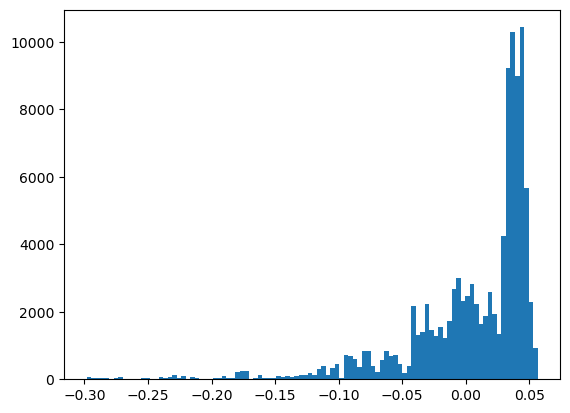

In [13]:
# plot score histogram to find the outliers
import matplotlib.pyplot as plt
plt.hist(score, bins = 100)

In [14]:
water_data['score'] = score

In [15]:
water_data

,timestamp,gage_height,score
0,2008-01-14 01:00:00,2.584704,-0.027750
1,2008-01-14 02:00:00,2.548128,-0.022412
2,2008-01-14 03:00:00,2.520696,-0.027670
3,2008-01-14 04:00:00,2.511552,-0.031359
4,2008-01-14 05:00:00,2.505456,-0.031486
...,...,...,...
104679,2022-01-10 20:00:00,2.468880,-0.031487
104680,2022-01-10 21:00:00,2.517648,-0.029576
104681,2022-01-10 22:00:00,2.639568,-0.038639
104682,2022-01-10 23:00:00,2.651760,-0.043332


In [16]:
# estimate of how many datapoints beyond outliers
water_data.query('score <-0.12')

,timestamp,gage_height,score
1227,2008-03-05 04:00:00,3.846576,-0.136487
1228,2008-03-05 05:00:00,3.956304,-0.161165
1229,2008-03-05 06:00:00,4.123944,-0.175690
1230,2008-03-05 07:00:00,4.184904,-0.179817
1231,2008-03-05 08:00:00,4.227576,-0.180182
...,...,...,...
97174,2021-03-04 02:00:00,3.767328,-0.121801
100986,2021-08-09 22:00:00,0.579120,-0.149677
100987,2021-08-09 23:00:00,0.509016,-0.152319
100988,2021-08-10 00:00:00,0.524256,-0.152319


In [17]:
# transferring into new dataframe
new_water_data= water_data
new_water_data

,timestamp,gage_height,score
0,2008-01-14 01:00:00,2.584704,-0.027750
1,2008-01-14 02:00:00,2.548128,-0.022412
2,2008-01-14 03:00:00,2.520696,-0.027670
3,2008-01-14 04:00:00,2.511552,-0.031359
4,2008-01-14 05:00:00,2.505456,-0.031486
...,...,...,...
104679,2022-01-10 20:00:00,2.468880,-0.031487
104680,2022-01-10 21:00:00,2.517648,-0.029576
104681,2022-01-10 22:00:00,2.639568,-0.038639
104682,2022-01-10 23:00:00,2.651760,-0.043332


In [18]:
# removing outliers 
new_water_data.drop((new_water_data.query('score <-0.12')).index, inplace = True)
new_water_data

,timestamp,gage_height,score
0,2008-01-14 01:00:00,2.584704,-0.027750
1,2008-01-14 02:00:00,2.548128,-0.022412
2,2008-01-14 03:00:00,2.520696,-0.027670
3,2008-01-14 04:00:00,2.511552,-0.031359
4,2008-01-14 05:00:00,2.505456,-0.031486
...,...,...,...
104679,2022-01-10 20:00:00,2.468880,-0.031487
104680,2022-01-10 21:00:00,2.517648,-0.029576
104681,2022-01-10 22:00:00,2.639568,-0.038639
104682,2022-01-10 23:00:00,2.651760,-0.043332


In [19]:
# droping the unnecessary score column
new_water_data =new_water_data.drop(['score'], axis=1)
new_water_data

,timestamp,gage_height
0,2008-01-14 01:00:00,2.584704
1,2008-01-14 02:00:00,2.548128
2,2008-01-14 03:00:00,2.520696
3,2008-01-14 04:00:00,2.511552
4,2008-01-14 05:00:00,2.505456
...,...,...
104679,2022-01-10 20:00:00,2.468880
104680,2022-01-10 21:00:00,2.517648
104681,2022-01-10 22:00:00,2.639568
104682,2022-01-10 23:00:00,2.651760


<AxesSubplot:>

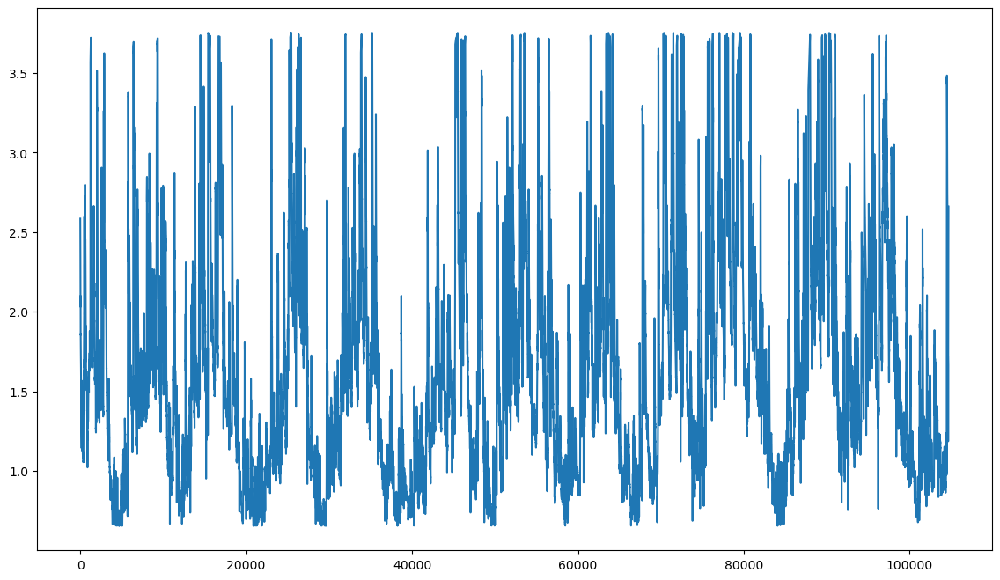

In [20]:
new_water_data['gage_height'].plot(figsize=(14,8))

In [21]:
# Set the DATE column as the index.
new_water_data = new_water_data.set_index('timestamp')
new_water_data.head()

,gage_height
timestamp,
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456


In [22]:
new_water_data.index

DatetimeIndex(['2008-01-14 01:00:00', '2008-01-14 02:00:00',
               '2008-01-14 03:00:00', '2008-01-14 04:00:00',
               '2008-01-14 05:00:00', '2008-01-14 06:00:00',
               '2008-01-14 07:00:00', '2008-01-14 08:00:00',
               '2008-01-14 09:00:00', '2008-01-14 10:00:00',
               ...
               '2022-01-10 15:00:00', '2022-01-10 16:00:00',
               '2022-01-10 17:00:00', '2022-01-10 18:00:00',
               '2022-01-10 19:00:00', '2022-01-10 20:00:00',
               '2022-01-10 21:00:00', '2022-01-10 22:00:00',
               '2022-01-10 23:00:00', '2022-01-11 00:00:00'],
              dtype='datetime64[ns]', name='timestamp', length=101463, freq=None)

In [23]:
new_water_data

,gage_height
timestamp,
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568


In [24]:
# finding duplicate
# new_water_data[new_water_data.index.duplicated()]
new_water_data.index.duplicated()

array([False, False, False, ..., False, False, False])

In [25]:
# Drops rows with duplicate index values (if there is any)
final_water_data = new_water_data.loc[~new_water_data.index.duplicated(), :]
final_water_data

,gage_height
timestamp,
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568


In [26]:
# Filling the miissing time series row
dt = pd.Series(data = pd.date_range(start=final_water_data.index.min(), end=final_water_data.index.max(), freq = '1H'))
idx = pd. DatetimeIndex(dt)
final_water_data2 = final_water_data.reindex(idx)

In [27]:
final_water_data2

,gage_height
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568
2022-01-10 23:00:00,2.651760


In [28]:
final_water_data3 = final_water_data2.interpolate(method = 'time')

In [29]:
final_water_data3

,gage_height
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568
2022-01-10 23:00:00,2.651760


<AxesSubplot:>

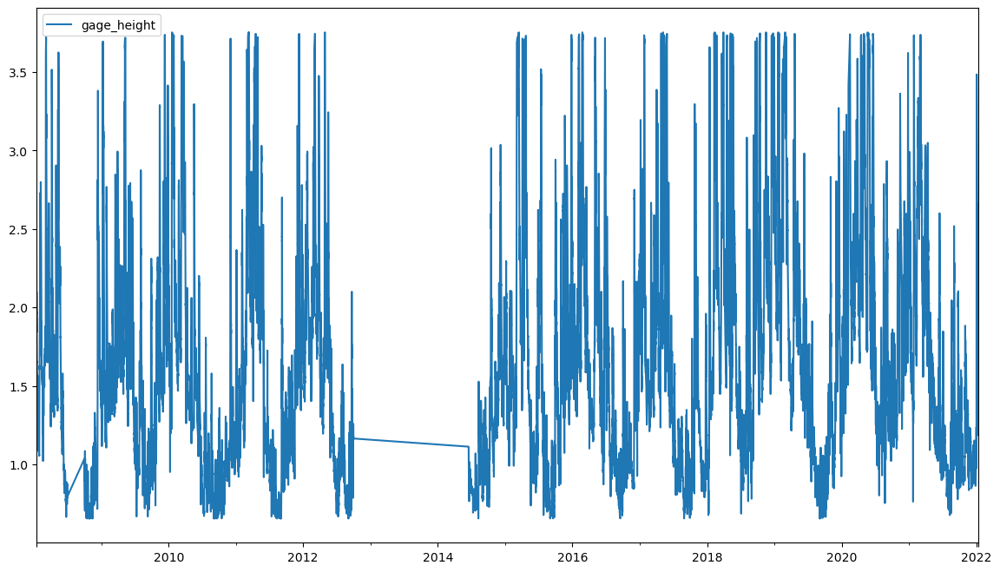

In [30]:
final_water_data3.plot(figsize=(14,8))

In [31]:
df = final_water_data3
df.head()

,gage_height
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456


In [32]:
df.columns = ['Value']
df

,Value
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568
2022-01-10 23:00:00,2.651760


In [33]:
#Verify that there are no empty cells in any column. The output should be all zeroes.
import numpy as np
df.isin([np.nan, np.inf, -np.inf]).sum()

Value    0
dtype: int64

In [34]:
# # 15 min---->> Hourly
# df = df.resample(rule='H').mean()

In [35]:
df

,Value
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568
2022-01-10 23:00:00,2.651760


<AxesSubplot:>

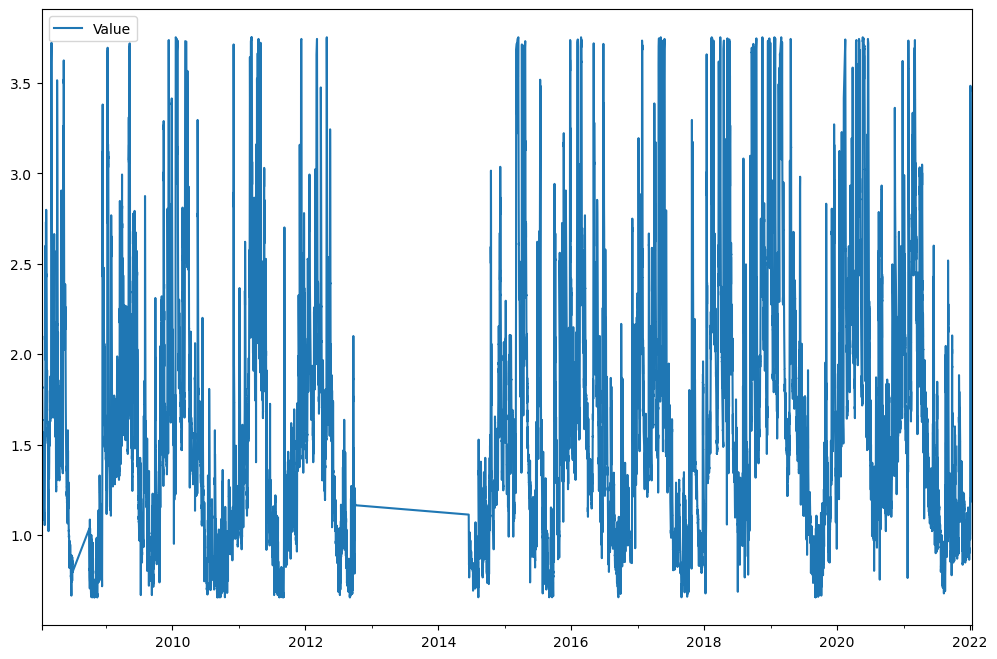

In [36]:
# Plot out the time series
df.plot(figsize=(12,8))

In [37]:

# data_count_15min_interval = len(final_water_data3)
# print(data_count_15min_interval)

# total data count based on 1hr interval

data_count_1hr_interval=len(df)
print(data_count_1hr_interval)

122664


In [39]:
# Train-test ratio selection

train_size = int(0.8*data_count_1hr_interval)
print(train_size)
test_size = data_count_1hr_interval-train_size
print(test_size)

98131
24533


In [40]:
dataset = df
dataset

,Value
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568
2022-01-10 23:00:00,2.651760


In [41]:
training_set = df.iloc[:train_size, 0:1].values
training_set

array([[2.584704],
       [2.548128],
       [2.520696],
       ...,
       [1.591056],
       [1.591056],
       [1.58496 ]])

In [42]:
len(training_set)

98131

In [43]:
testing_set = df.iloc[train_size:, 0:1].values
testing_set.shape

(24533, 1)

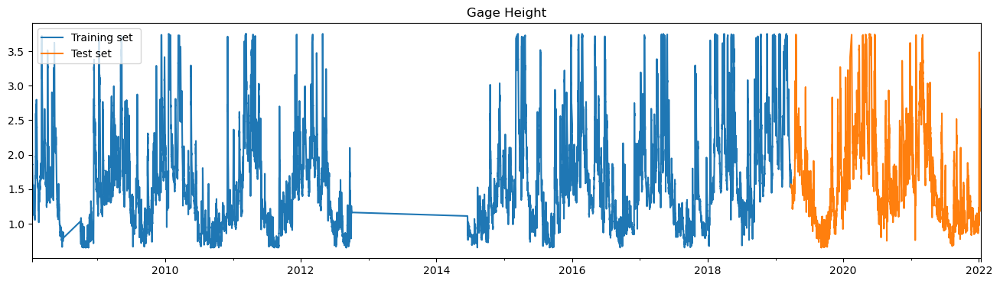

In [44]:
df['Value'][:train_size].plot(figsize=(16,4),legend=True)
df['Value'][train_size:].plot(figsize=(16,4),legend=True)
plt.legend(['Training set ','Test set'])
plt.title('Gage Height')
plt.show()

In [45]:
# Feature scaling to optimize the training set
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(training_set)

In [46]:
# Create a data structure with 1 timesteps and 1 output
# Format it into a three-dimensional array for use in our LSTM model
X_train = []
y_train = []
for i in range(1, train_size):
    X_train.append(training_set_scaled[i-1:i, 0]) # Appending previous 1 data.
    y_train.append(training_set_scaled[i, 0])

X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping (LSMT Model needs to be 3- dimensional) following format (values, time-steps, 1 dimensional output).
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_train.shape

(98130, 1, 1)

In [47]:
# Create GRU model
def create_gru(units):
    model = Sequential()
    # Input layer
    model.add(GRU (units = units, return_sequences = True, 
    input_shape = [X_train.shape[1], X_train.shape[2]]))
    model.add(Dropout(0.2)) 
    # Hidden layer
    model.add(GRU(units = units)) 
    model.add(Dropout(0.2))
    model.add(Dense(units = 1)) 
    #Compile model
    model.compile(optimizer='adam',loss='mse')
    return model
model_gru = create_gru(64)

2023-05-08 17:49:24.896187: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [48]:
import keras
def fit_model(model):
    
#-----Early stop implementation-----  
#     early_stop = keras.callbacks.EarlyStopping(monitor = 'val_loss',
#                                                patience = 10)
#     history = model.fit(X_train, y_train, epochs = 50,  
#                         validation_split = 0.2,
#                         batch_size = 16, shuffle = False, 
#                         callbacks = [early_stop])
    
# ------ without Early stop ----
    history = model.fit(X_train, y_train, epochs = 50,  
                        validation_split = 0.2,
                        batch_size = 16, shuffle = False 
                        )    
    return history


In [49]:
history_gru = fit_model(model_gru)

Epoch 1/50
4907/4907 [==============================] - 11s 2ms/step - loss: 0.0018 - val_loss: 3.8068e-04
Epoch 2/50
4907/4907 [==============================] - 8s 2ms/step - loss: 9.8944e-04 - val_loss: 0.0014
Epoch 3/50
4907/4907 [==============================] - 8s 2ms/step - loss: 9.3044e-04 - val_loss: 0.0013
Epoch 4/50
4907/4907 [==============================] - 8s 2ms/step - loss: 9.9652e-04 - val_loss: 0.0013
Epoch 5/50
4907/4907 [==============================] - 8s 2ms/step - loss: 8.8625e-04 - val_loss: 0.0011
Epoch 6/50
4907/4907 [==============================] - 8s 2ms/step - loss: 8.0084e-04 - val_loss: 0.0012
Epoch 7/50
4907/4907 [==============================] - 8s 2ms/step - loss: 8.5473e-04 - val_loss: 0.0013
Epoch 8/50
4907/4907 [==============================] - 8s 2ms/step - loss: 8.4655e-04 - val_loss: 7.9074e-04
Epoch 9/50
4907/4907 [==============================] - 8s 2ms/step - loss: 7.5698e-04 - val_loss: 8.4866e-04
Epoch 10/50
4907/4907 [==============

In [50]:
# Create BiLSTM model
def create_bilstm(units):
    model = Sequential()
    # Input layer
    model.add(Bidirectional(
              LSTM(units = units, return_sequences=True), 
              input_shape=(X_train.shape[1], X_train.shape[2])))
    # Hidden layer
    model.add(Bidirectional(LSTM(units = units)))
    model.add(Dense(1))
    #Compile model
    model.compile(optimizer='adam',loss='mse')
    return model
model_bilstm = create_bilstm(64)

In [51]:
history_bilstm = fit_model(model_bilstm)

Epoch 1/50
4907/4907 [==============================] - 13s 2ms/step - loss: 0.0013 - val_loss: 7.2761e-04
Epoch 2/50
4907/4907 [==============================] - 10s 2ms/step - loss: 3.3179e-04 - val_loss: 0.0011
Epoch 3/50
4907/4907 [==============================] - 10s 2ms/step - loss: 3.5239e-04 - val_loss: 0.0010
Epoch 4/50
4907/4907 [==============================] - 11s 2ms/step - loss: 3.1967e-04 - val_loss: 8.8304e-04
Epoch 5/50
4907/4907 [==============================] - 12s 2ms/step - loss: 3.2827e-04 - val_loss: 7.2780e-04
Epoch 6/50
4907/4907 [==============================] - 10s 2ms/step - loss: 3.3262e-04 - val_loss: 6.6075e-04
Epoch 7/50
4907/4907 [==============================] - 10s 2ms/step - loss: 3.4051e-04 - val_loss: 5.1954e-04
Epoch 8/50
4907/4907 [==============================] - 10s 2ms/step - loss: 3.2829e-04 - val_loss: 3.5546e-04
Epoch 9/50
4907/4907 [==============================] - 10s 2ms/step - loss: 2.8595e-04 - val_loss: 3.2223e-04
Epoch 10/50
4

In [52]:
# creating LSTM model
model_lstm = Sequential()

# Adding first LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True, input_shape = (X_train.shape[1], 1)))
model_lstm.add(Dropout(0.1))

# Adding second LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True))
model_lstm.add(Dropout(0.1))

# Adding third LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True))
model_lstm.add(Dropout(0.1))

# Adding fourth LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True))
model_lstm.add(Dropout(0.1))

# Adding fifth LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100))
model_lstm.add(Dropout(0.1))

# Adding the Output Layer
model_lstm.add(Dense(units=1))

# Compiling the model
# Because we're doing regression hence mean_squared_error
model_lstm.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [53]:
history_lstm = fit_model(model_lstm)

Epoch 1/50
4907/4907 [==============================] - 26s 5ms/step - loss: 0.0073 - val_loss: 0.0117
Epoch 2/50
4907/4907 [==============================] - 21s 4ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 3/50
4907/4907 [==============================] - 21s 4ms/step - loss: 0.0016 - val_loss: 0.0034
Epoch 4/50
4907/4907 [==============================] - 21s 4ms/step - loss: 0.0016 - val_loss: 0.0019
Epoch 5/50
4907/4907 [==============================] - 22s 4ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 6/50
4907/4907 [==============================] - 22s 4ms/step - loss: 0.0011 - val_loss: 9.2602e-04
Epoch 7/50
4907/4907 [==============================] - 23s 5ms/step - loss: 0.0011 - val_loss: 7.5540e-04
Epoch 8/50
4907/4907 [==============================] - 22s 4ms/step - loss: 9.9109e-04 - val_loss: 0.0011
Epoch 9/50
4907/4907 [==============================] - 21s 4ms/step - loss: 9.7500e-04 - val_loss: 7.5191e-04
Epoch 10/50
4907/4907 [==============================

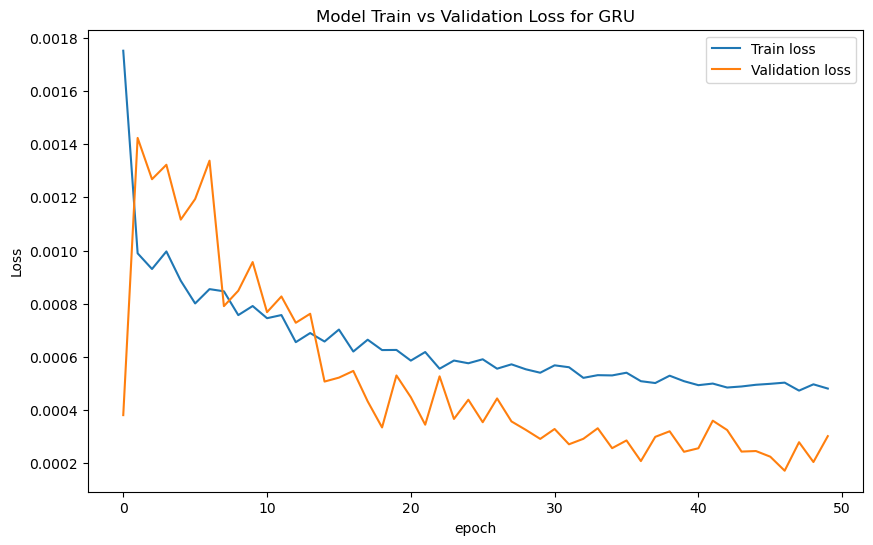

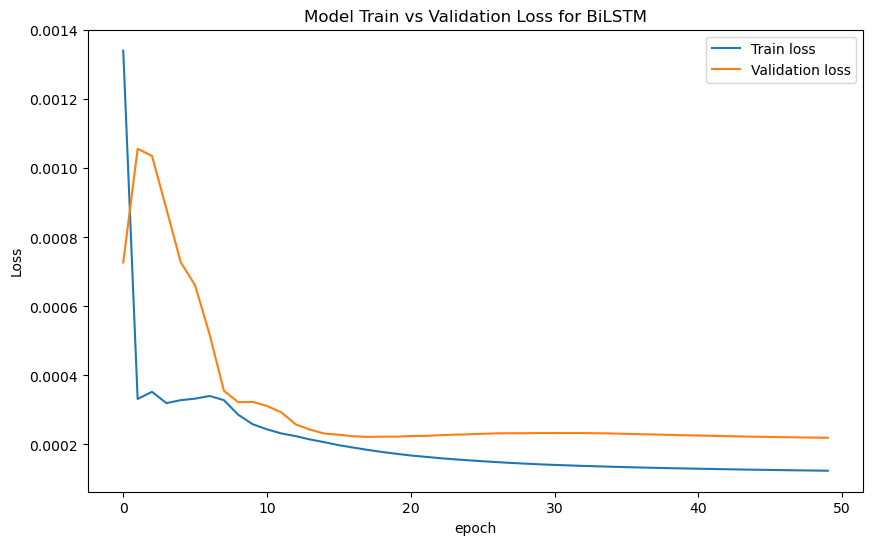

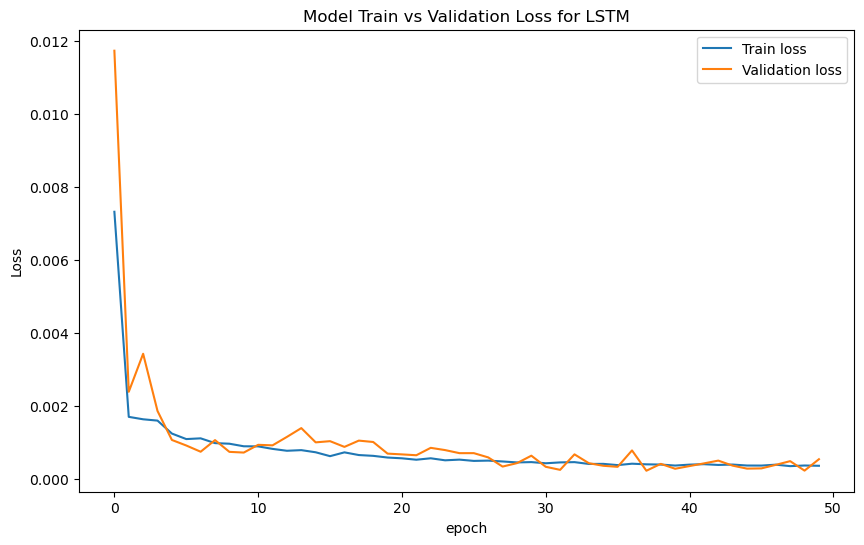

In [54]:
# Evaluating The Model
def plot_loss (history, model_name):
    plt.figure(figsize = (10, 6))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Train vs Validation Loss for ' + model_name)
    plt.ylabel('Loss')
    plt.xlabel('epoch')
    plt.legend(['Train loss', 'Validation loss'], loc='upper right')
 
plot_loss (history_gru, 'GRU')
plot_loss (history_bilstm, 'BiLSTM')
plot_loss (history_lstm, 'LSTM')

In [55]:
df

,Value
2008-01-14 01:00:00,2.584704
2008-01-14 02:00:00,2.548128
2008-01-14 03:00:00,2.520696
2008-01-14 04:00:00,2.511552
2008-01-14 05:00:00,2.505456
...,...
2022-01-10 20:00:00,2.468880
2022-01-10 21:00:00,2.517648
2022-01-10 22:00:00,2.639568
2022-01-10 23:00:00,2.651760


In [56]:
# We will concatenate the dataset and then scale them, as the last 1 data needs to be from training set
dataset_total = df['Value']
inputs = dataset_total[len(dataset_total) - len(testing_set) - 1:].values
inputs = inputs.reshape(-1,1) # reshape(-1,1) means one column with all rows
inputs = sc.transform(inputs)

X_test = []
for i in range(1, test_size+1): # 1+5276(test size)
    X_test.append(inputs[i-1:i, 0])

X_test = np.array(X_test)
# 3D format for LSTM
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [57]:
inputs.shape

(24534, 1)

In [58]:
X_test.shape

(24533, 1, 1)

In [59]:
#preict the model
# Make prediction
def prediction(model):
    prediction = model.predict(X_test)
    prediction = sc.inverse_transform(prediction)
    return prediction
prediction_gru = prediction(model_gru)
prediction_bilstm = prediction(model_bilstm)
prediction_lstm = prediction(model_lstm)


767/767 [==============================] - 2s 1ms/step


In [60]:
# Inverse the scaling
#predicted_gage_height = sc.inverse_transform(predicted_gage_height)

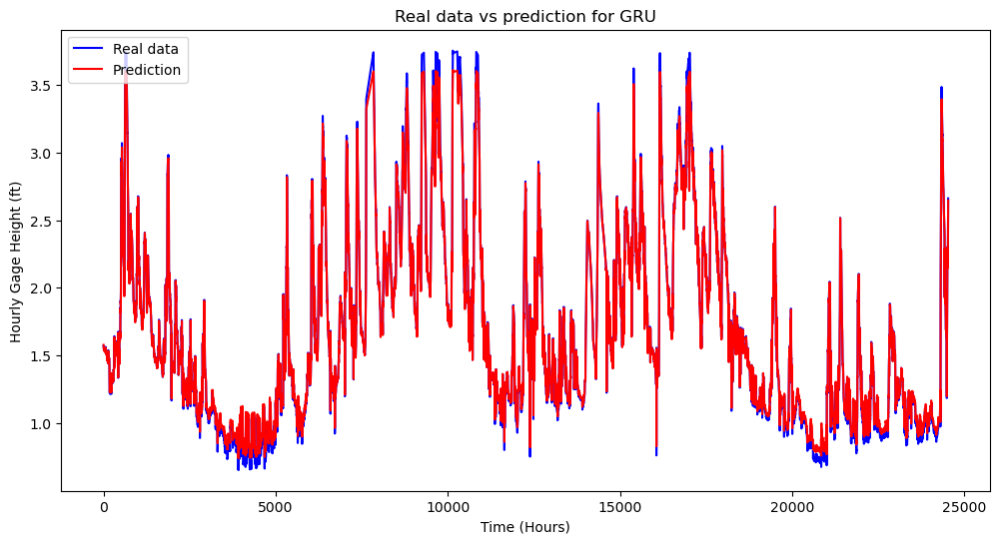

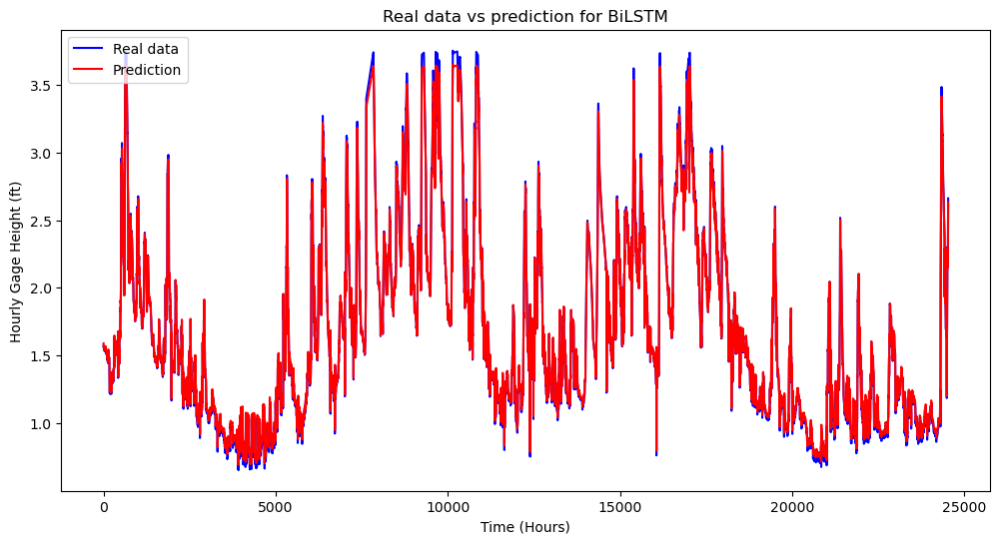

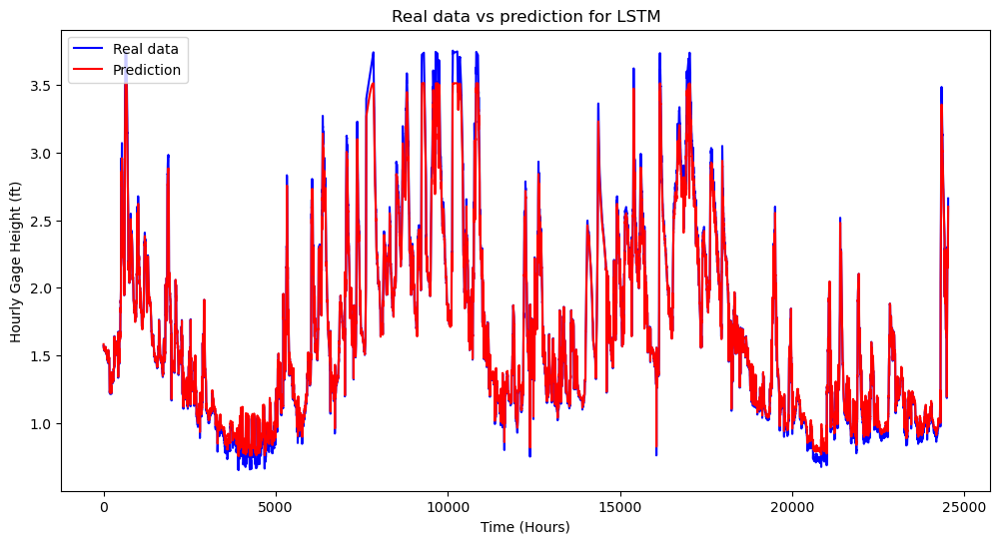

In [61]:
# Plot test data vs prediction
# Prediction is on top of real data
def plot_future(prediction, model_name, y_test):
    plt.figure(figsize=(12, 6))
    range_future = len(prediction)

    plt.plot(np.arange(range_future), np.array(y_test), 
             label='Real data', color='b')
    plt.plot(np.arange(range_future), 
             np.array(prediction),label='Prediction',color='r')
    
    plt.title('Real data vs prediction for ' + model_name)
    plt.legend(loc='upper left')
    plt.xlabel('Time (Hours)')
    plt.ylabel('Hourly Gage Height (ft)')
 
plot_future(prediction_gru, 'GRU', testing_set)
plot_future(prediction_bilstm, 'BiLSTM', testing_set)
plot_future(prediction_lstm, 'LSTM', testing_set)

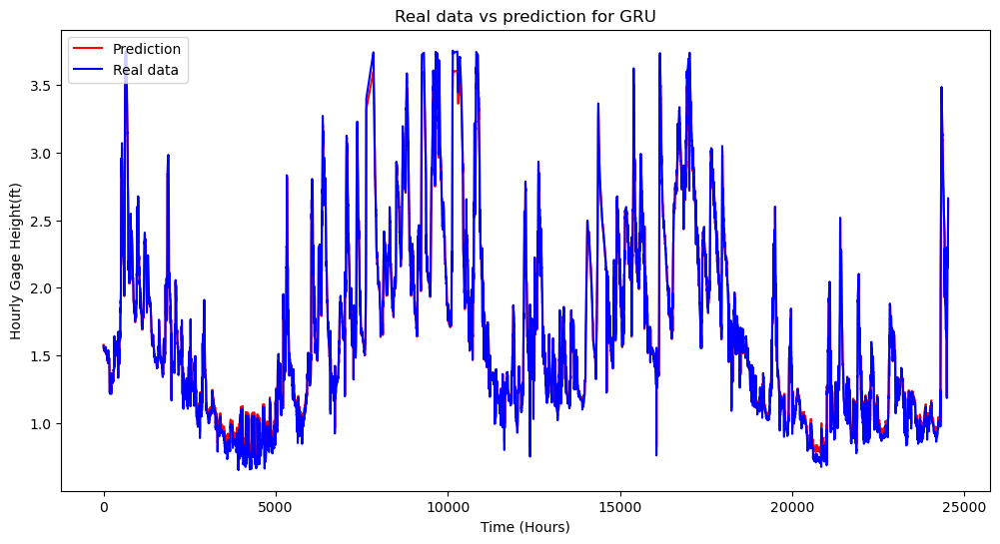

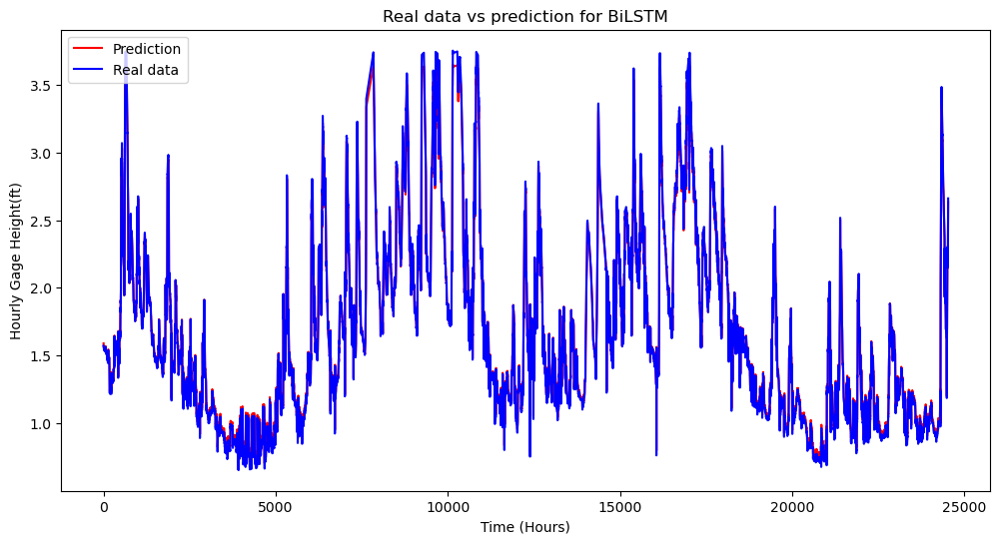

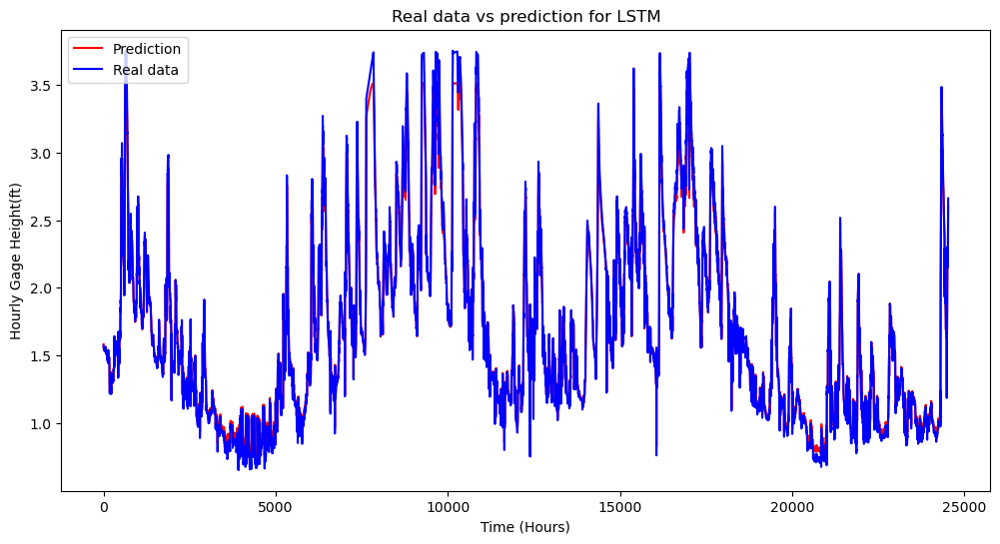

In [62]:
# Plot test data vs prediction
# Real data is on top of prediction
def plot_future(prediction, model_name, y_test):
    plt.figure(figsize=(12, 6))
    range_future = len(prediction)
    
    plt.plot(np.arange(range_future), 
             np.array(prediction),label='Prediction',color='r')
    
    plt.plot(np.arange(range_future), np.array(y_test), 
             label='Real data', color='b')
    
    plt.title('Real data vs prediction for ' + model_name)
    plt.legend(loc='upper left')
    plt.xlabel('Time (Hours)')
    plt.ylabel('Hourly Gage Height(ft)')
 
plot_future(prediction_gru, 'GRU', testing_set)
plot_future(prediction_bilstm, 'BiLSTM', testing_set)
plot_future(prediction_lstm, 'LSTM', testing_set)

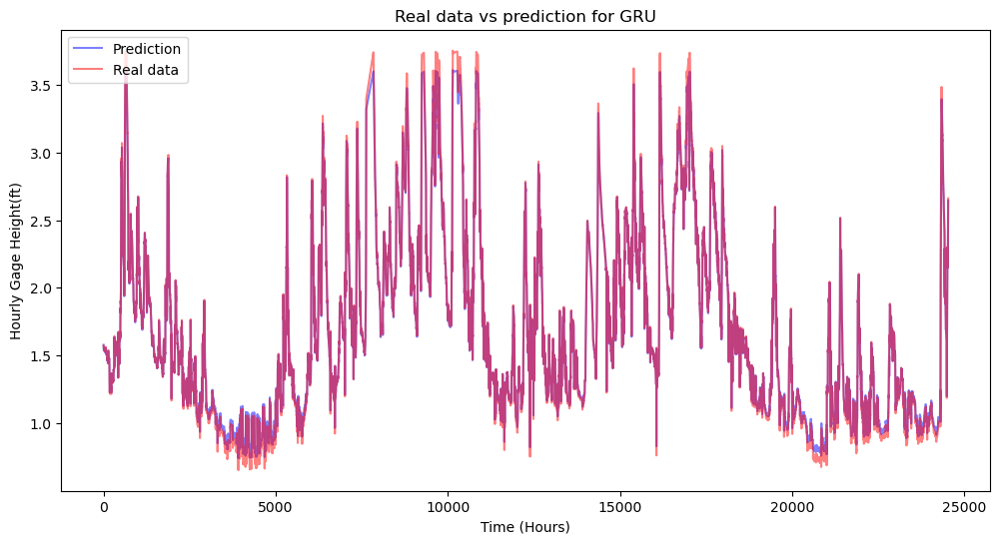

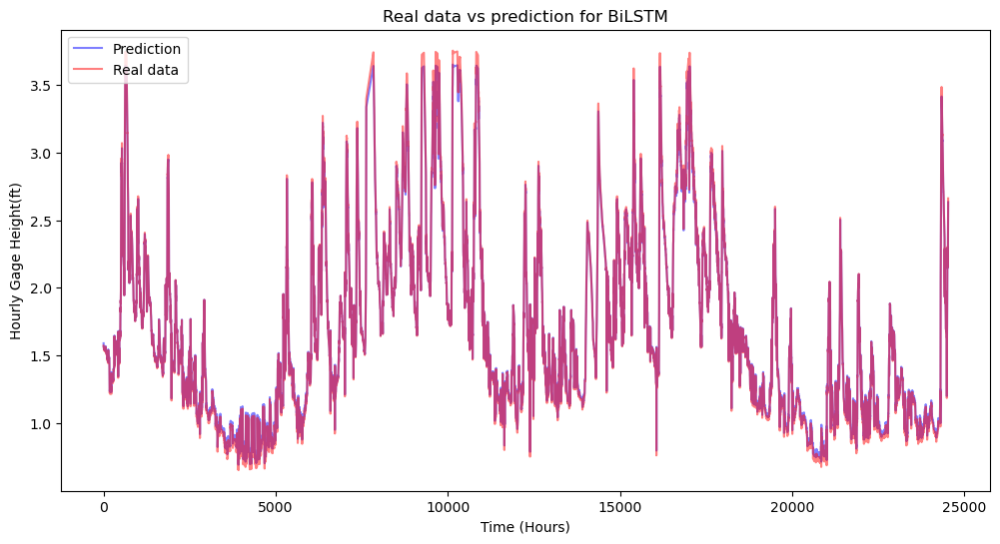

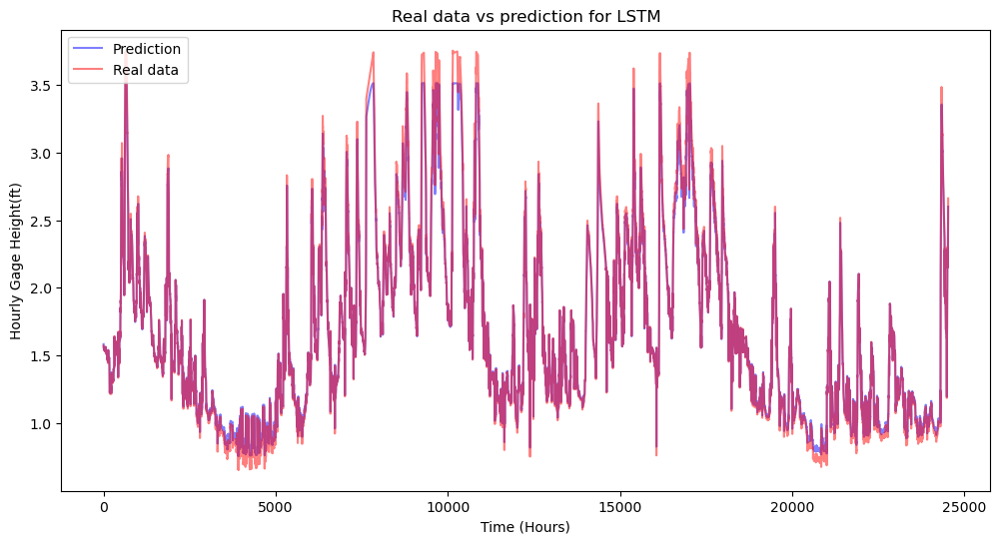

In [63]:
# Plot test data vs prediction
# changing opacity to see the overlapping
def plot_future(prediction, model_name, y_test):
    plt.figure(figsize=(12, 6))
    range_future = len(prediction)
    
    plt.plot(np.arange(range_future), 
             np.array(prediction),label='Prediction',color='b', alpha=0.5)
    
    plt.plot(np.arange(range_future), np.array(y_test), 
             label='Real data', color='r', alpha=0.5)
    
    plt.title('Real data vs prediction for ' + model_name)
    plt.legend(loc='upper left')
    plt.xlabel('Time (Hours)')
    plt.ylabel('Hourly Gage Height(ft)')
 
plot_future(prediction_gru, 'GRU', testing_set)
plot_future(prediction_bilstm, 'BiLSTM', testing_set)
plot_future(prediction_lstm, 'LSTM', testing_set)

In [64]:
from sklearn.metrics import mean_squared_error
error = mean_squared_error(testing_set, prediction_gru)
print(f'GRU MSE Error: {error}')

from statsmodels.tools.eval_measures import rmse
error = rmse(testing_set, prediction_gru)
print(f'GRU RMSE Error: {error}')

from sklearn.metrics import mean_absolute_percentage_error
error = mean_absolute_percentage_error(testing_set, prediction_gru)
print(f'GRU MAPE Error: {error}')

GRU MSE Error: 0.0023710735022083314
GRU RMSE Error: [0.04869367]
GRU MAPE Error: 0.022008990521267997


In [65]:

error = mean_squared_error(testing_set, prediction_bilstm)
print(f'BiLSTM MSE Error: {error}')


error = rmse(testing_set, prediction_bilstm)
print(f'BiLSTM RMSE Error: {error}')

error = mean_absolute_percentage_error(testing_set, prediction_bilstm)
print(f'BiLSTM MAPE Error: {error}')

BiLSTM MSE Error: 0.0018508365104243113
BiLSTM RMSE Error: [0.04302135]
BiLSTM MAPE Error: 0.018548249191415386


In [66]:

error = mean_squared_error(testing_set, prediction_lstm)
print(f'LSTM MSE Error: {error}')


error = rmse(testing_set, prediction_lstm)
print(f'LSTM RMSE Error: {error}')

error = mean_absolute_percentage_error(testing_set, prediction_lstm)
print(f'LSTM MAPE Error: {error}')

LSTM MSE Error: 0.003718619192419363
LSTM RMSE Error: [0.06098048]
LSTM MAPE Error: 0.02350157748422664


In [67]:
from sklearn.metrics import r2_score

GRU_r2 = r2_score(testing_set, prediction_gru)
print(f'R2 score of GRU: {GRU_r2}')

BiLSTM_r2 = r2_score(testing_set, prediction_bilstm)
print(f'R2 score of BiLSTM: {BiLSTM_r2}')

LSTM_r2 = r2_score(testing_set, prediction_lstm)
print(f'R2 score of LSTM: {LSTM_r2}')

R2 score of GRU: 0.9955611332269196
R2 score of BiLSTM: 0.9965350645263107
R2 score of LSTM: 0.9930384042672673
